In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pyplot import figure
from matplotlib.pyplot import suptitle
import matplotlib.style as style
from IPython.display import display, HTML
import warnings
%config InlineBackend.figure_format = 'png' #set 'png' here when working on notebook
warnings.filterwarnings('ignore') 

# Set some parameters to get good visuals - style to ggplot and size to 15,10

pd.set_option('display.width',170, 'display.max_rows',200, 'display.max_columns',900)

In [2]:
df = pd.read_csv("/Users/pvaish10/Desktop/TADPOLE_D1_D2.csv")

In [3]:
df1 = df[['RID', 'PTID', 'VISCODE','D1', 'D2','DX','EXAMDATE','Years_bl','Month','AGE', 'PTGENDER', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG','AV45',
         'CDRSB','ADAS11','MMSE', 'RAVLT_immediate','Hippocampus', 'WholeBrain','Entorhinal', 'MidTemp','ABETA_UPENNBIOMK9_04_19_17',
         'TAU_UPENNBIOMK9_04_19_17','PTAU_UPENNBIOMK9_04_19_17']]

In [4]:
df1.head(1)

,RID,PTID,VISCODE,D1,D2,DX,EXAMDATE,Years_bl,Month,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,FDG,AV45,CDRSB,ADAS11,MMSE,RAVLT_immediate,Hippocampus,WholeBrain,Entorhinal,MidTemp,ABETA_UPENNBIOMK9_04_19_17,TAU_UPENNBIOMK9_04_19_17,PTAU_UPENNBIOMK9_04_19_17
0,2,011_S_0002,bl,1,1,NL,2005-09-08,0.0,0,74.3,Male,16,Not Hisp/Latino,White,Married,0.0,1.36926,NaN,0.0,10.67,28.0,44.0,8336.0,1229740.0,4177.0,27936.0,,,


#### Select rows which have a DX value

In [5]:
df2 = df1.loc[df1['DX'].notnull()]

#### Make only three categories

In [6]:
df2 = df2.replace({'NL to MCI': 'MCI', 'MCI to Dementia': 'Dementia', 'MCI to NL' : 'NL', 'NL to Dementia': 'Dementia', 'Dementia to MCI': 'MCI'})

In [7]:
df2['DX'].value_counts()

MCI         4052
NL          2745
Dementia    2107
Name: DX, dtype: int64

#### Update the age as per the exam and diagnosis

In [8]:
df2['AGE_UPDATED'] = np.round(df2['AGE'] + df2['Years_bl'], 2)

In [9]:
df2.columns

Index(['RID', 'PTID', 'VISCODE', 'D1', 'D2', 'DX', 'EXAMDATE', 'Years_bl', 'Month', 'AGE', 'PTGENDER', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG',
       'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp', 'ABETA_UPENNBIOMK9_04_19_17',
       'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED'],
      dtype='object')

#### How many examples are there

In [10]:
df2['D1'][df2['D1'] == 1].shape

(8841,)

In [11]:
df2['D1'][df2['D1'] == 0].shape

(63,)

In [12]:
df2['D2'][df2['D2'] == 1].shape

(5177,)

In [13]:
df2['D2'][df2['D2'] == 0].shape

(3727,)

In [14]:
df2.head(1)

,RID,PTID,VISCODE,D1,D2,DX,EXAMDATE,Years_bl,Month,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,FDG,AV45,CDRSB,ADAS11,MMSE,RAVLT_immediate,Hippocampus,WholeBrain,Entorhinal,MidTemp,ABETA_UPENNBIOMK9_04_19_17,TAU_UPENNBIOMK9_04_19_17,PTAU_UPENNBIOMK9_04_19_17,AGE_UPDATED
0,2,011_S_0002,bl,1,1,NL,2005-09-08,0.0,0,74.3,Male,16,Not Hisp/Latino,White,Married,0.0,1.36926,NaN,0.0,10.67,28.0,44.0,8336.0,1229740.0,4177.0,27936.0,,,,74.3


### Select the columns

In [15]:
df2.columns

Index(['RID', 'PTID', 'VISCODE', 'D1', 'D2', 'DX', 'EXAMDATE', 'Years_bl', 'Month', 'AGE', 'PTGENDER', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG',
       'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp', 'ABETA_UPENNBIOMK9_04_19_17',
       'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED'],
      dtype='object')

In [16]:
df2['ABETA_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df2['ABETA_UPENNBIOMK9_04_19_17'], errors='coerce')
df2['TAU_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df2['TAU_UPENNBIOMK9_04_19_17'], errors='coerce')
df2['PTAU_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df2['PTAU_UPENNBIOMK9_04_19_17'], errors='coerce')

In [17]:
df3 = df2[['D1', 'D2', 'DX',  'PTGENDER', 'PTEDUCAT', 'APOE4', 'FDG',
       'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp', 'ABETA_UPENNBIOMK9_04_19_17',
       'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED']]

In [18]:
df3 = df3.replace({'NL': 1 , 'MCI': 2, 'Dementia': 3})

In [19]:
categorial_cols = [
    'PTGENDER']

for cc in categorial_cols:
    dummies = pd.get_dummies(df3[cc])
    dummies = dummies.add_prefix("{}#".format(cc))
    df3.drop(cc, axis=1, inplace=True)
    df3 = df3.join(dummies)

In [20]:
df3.columns

Index(['D1', 'D2', 'DX', 'PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male'],
      dtype='object')

In [21]:
df4 = df3[['DX', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED']]

#### Correlation Analysis

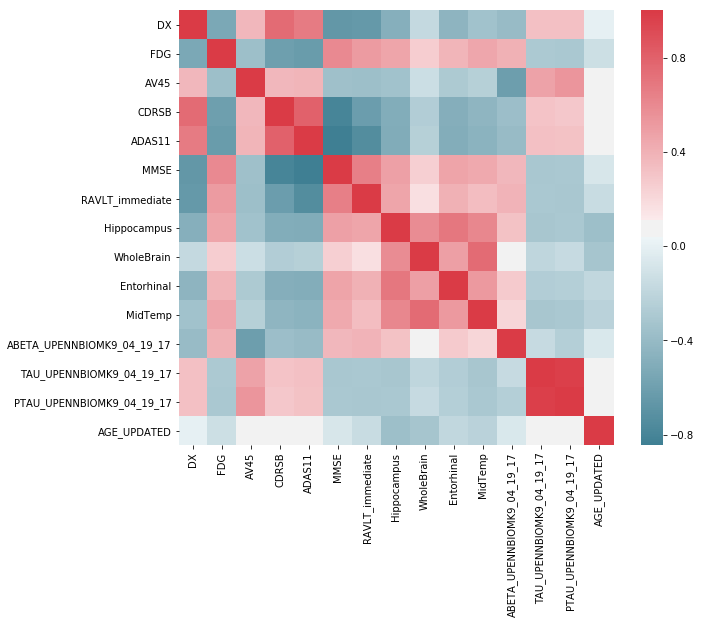

In [22]:
f, ax = plt.subplots(figsize=(10, 8)) 
corr = df4.corr(method = 'pearson') 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            square=True, ax=ax) 

#### Correlation matrix

In [23]:
df4.corr(method = 'pearson') 

,DX,FDG,AV45,CDRSB,ADAS11,MMSE,RAVLT_immediate,Hippocampus,WholeBrain,Entorhinal,MidTemp,ABETA_UPENNBIOMK9_04_19_17,TAU_UPENNBIOMK9_04_19_17,PTAU_UPENNBIOMK9_04_19_17,AGE_UPDATED
DX,1.000000,-0.537924,0.369889,0.751463,0.675037,-0.660572,-0.643512,-0.479757,-0.169255,-0.443162,-0.344146,-0.396272,0.327901,0.328018,0.001710
FDG,-0.537924,1.000000,-0.365847,-0.604635,-0.626500,0.597089,0.514796,0.465169,0.258703,0.384648,0.455665,0.403407,-0.293311,-0.302773,-0.125127
AV45,0.369889,-0.365847,1.000000,0.370759,0.382772,-0.360170,-0.362832,-0.340625,-0.133296,-0.289758,-0.243819,-0.613940,0.479905,0.538855,0.085368
CDRSB,0.751463,-0.604635,0.370759,1.000000,0.803674,-0.800535,-0.619040,-0.504093,-0.254510,-0.487076,-0.437170,-0.371078,0.308724,0.291296,0.077781
ADAS11,0.675037,-0.626500,0.382772,0.803674,1.000000,-0.845144,-0.740403,-0.507372,-0.244333,-0.496001,-0.457203,-0.392934,0.328923,0.316196,0.084853
MMSE,-0.660572,0.597089,-0.360170,-0.800535,-0.845144,1.000000,0.651944,0.487784,0.255801,0.466712,0.440958,0.366663,-0.311000,-0.298598,-0.075727
RAVLT_immediate,-0.643512,0.514796,-0.362832,-0.619040,-0.740403,0.651944,1.000000,0.464828,0.171296,0.408314,0.342407,0.388786,-0.301120,-0.304610,-0.148917
Hippocampus,-0.479757,0.465169,-0.340625,-0.504093,-0.507372,0.487784,0.464828,1.000000,0.588082,0.692272,0.617681,0.315475,-0.312795,-0.298276,-0.363644
WholeBrain,-0.169255,0.258703,-0.133296,-0.254510,-0.244333,0.255801,0.171296,0.588082,1.000000,0.489668,0.751364,0.073228,-0.191421,-0.166974,-0.319059
Entorhinal,-0.443162,0.384648,-0.289758,-0.487076,-0.496001,0.466712,0.408314,0.692272,0.489668,1.000000,0.523957,0.275424,-0.259621,-0.248978,-0.187868


#### Dispersion matrix

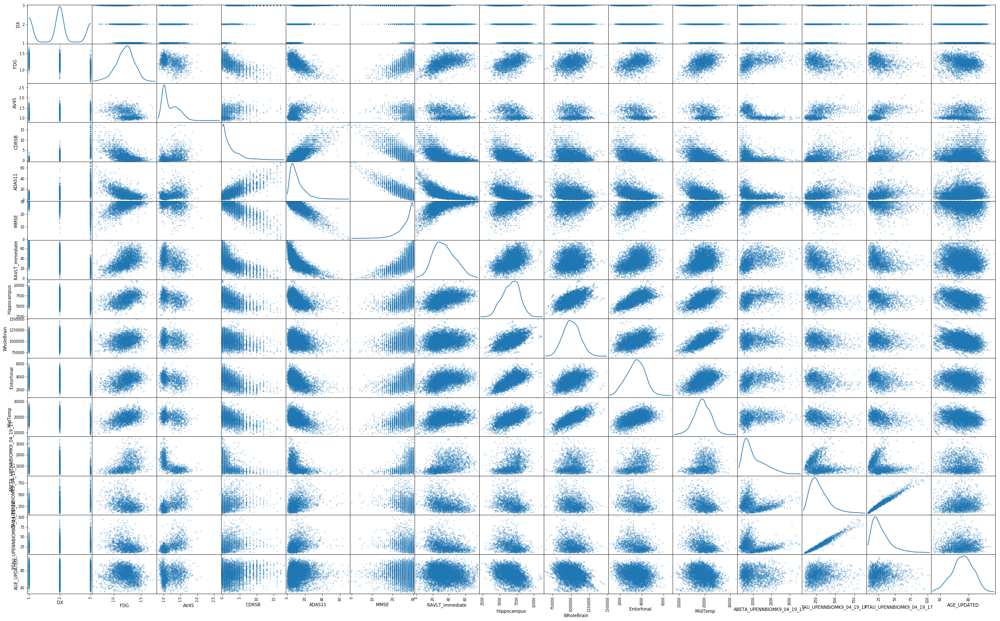

In [24]:
pd.scatter_matrix(df4, alpha = 0.3, figsize = (40,25), diagonal = 'kde'); 

#### Graphs of all these correlations

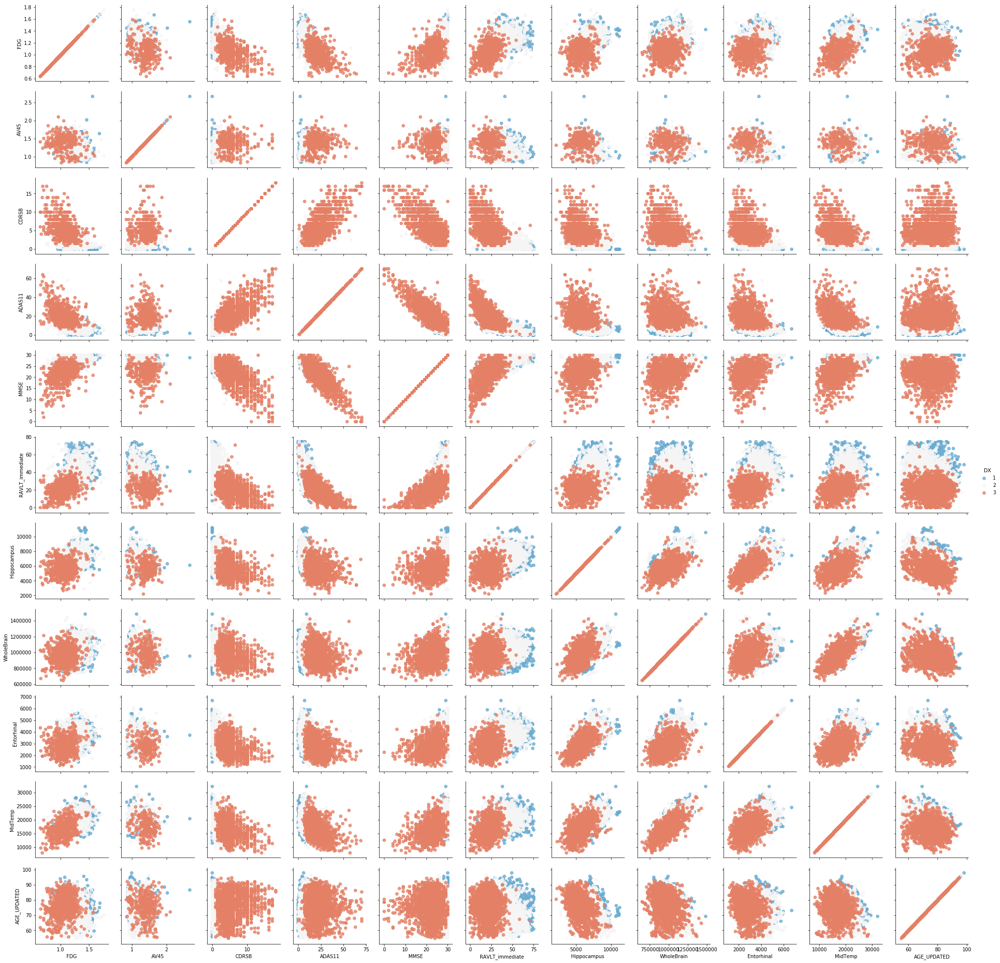

In [25]:
g = sns.PairGrid(df4, vars=['FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
         'AGE_UPDATED'],
                 hue='DX', palette='RdBu_r')
g.map(plt.scatter, alpha=0.8)
g.add_legend();

#### Miscelleneous Charts

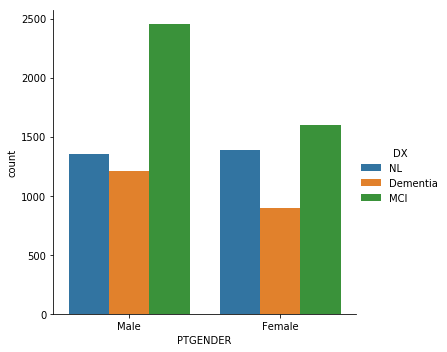

In [26]:
sns.factorplot('PTGENDER',data=df2,hue='DX',kind="count")

(12.5, 30.0)

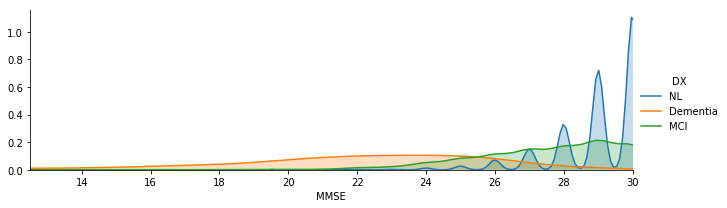

In [27]:
facet= sns.FacetGrid(df2,hue="DX", aspect=3)
facet.map(sns.kdeplot,'MMSE',shade= True)
facet.set(xlim=(0, df2['MMSE'].max()))
facet.add_legend()
plt.xlim(12.5)

(12.5, 70.0)

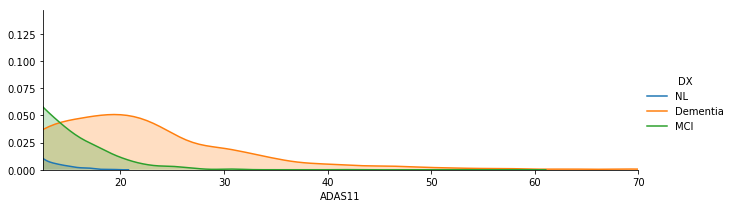

In [28]:
facet= sns.FacetGrid(df2,hue="DX", aspect=3)
facet.map(sns.kdeplot,'ADAS11',shade= True)
facet.set(xlim=(0, df2['ADAS11'].max()))
facet.add_legend()
plt.xlim(12.5)

(12.5, 75.0)

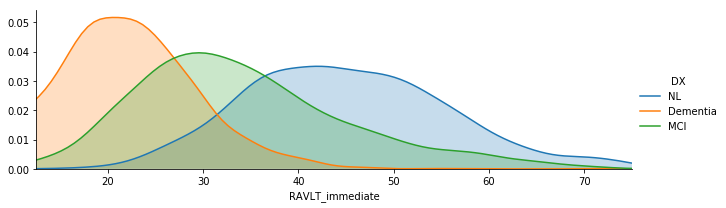

In [29]:
facet= sns.FacetGrid(df2,hue="DX", aspect=3)
facet.map(sns.kdeplot,'RAVLT_immediate',shade= True)
facet.set(xlim=(0, df2['RAVLT_immediate'].max()))
facet.add_legend()
plt.xlim(12.5)

### Imputation of lost values
For various reasons, many real-world data sets contain missing values, often encoded as blanks, NaNs, or other placeholders. However, these data sets are incompatible with scikit-learn estimators that assume that all values ​​in a matrix are numeric, and that they all have and have meaning. A basic strategy for using incomplete datasets is to discard rows and / or complete columns that contain missing values. However, this has the price of losing data that can be valuable (though incomplete). A better strategy is to impute the lost values, that is, to deduce them from the known part of the data.

The Imputer class provides basic strategies for imputation of missing values, using either the mean, the median or the most frequent value of the row or column in which the missing values ​​are found. This class also allows different encodings of missing values.

In [30]:
predictors = ['D1', 'D2','PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']


In [31]:
train_X = df3[predictors][df3['D1'] == 1]
train_X = train_X[['PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']]
test_X = df3[predictors][df3['D2'] == 1]
test_X = test_X[['PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']]


train_y = df3.DX[df3['D1'] == 1]
test_y = df3.DX[df3['D2'] == 1]

In [32]:
from sklearn.impute  import SimpleImputer
# We perform it with the most frequent value 
my_imputer = SimpleImputer( missing_values = np.nan,strategy='most_frequent')
train_X_imputed = pd.DataFrame(my_imputer.fit_transform(train_X.values))
test_X_imputed = pd.DataFrame(my_imputer.fit_transform(test_X.values))

In [33]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_X_scaled=scaler.fit_transform(train_X_imputed)
test_X_scaled=scaler.fit_transform(test_X_imputed)

In [ ]:
#https://www.kaggle.com/rodrigox93/detecting-early-alzheimer-s-hyperparameter-0-86
import pandas as pd
from scipy.io import arff
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from sklearn import preprocessing
import numpy as np

from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn import metrics


import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
FOLDS =10
scoring = ['f1']

### Tuning Hyperparameters for better models
Before adjusting our models, we will look for the parameters that give us a high AUC

#### 1° Random Forest

In [ ]:
# Number of trees in random forest
n_estimators = range(10,250)
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = range(1,40)
# Minimum number of samples required to split a node
min_samples_split = range(3,60)
# Create the random grid
parametro_rf = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split}
model_forest = RandomForestClassifier(n_jobs=-1)
forest_random = RandomizedSearchCV(estimator = model_forest, param_distributions = parametro_rf, n_iter = 100, cv = FOLDS, 
                               verbose=2, random_state=42, n_jobs = -1, scoring ='accuracy')
forest_random.fit(train_X_scaled, train_y)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   27.1s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  4.3min finished


RandomizedSearchCV(cv=10, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=-1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          fit_params=None, iid='warn', n_iter=100, n_jobs=-1,
          param_distributions={'n_estimators': range(10, 250), 'max_features': ['auto', 'sqrt'], 'max_depth': range(1, 40), 'min_samples_split': range(3, 60)},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring='accuracy', verbose=2)

In [ ]:
forest_random.best_params_

{'n_estimators': 49,
 'min_samples_split': 25,
 'max_features': 'auto',
 'max_depth': 22}

#### 2° Extra Tree

In [ ]:
# Number of trees in random forest
n_estimators = range(50,280)
# Maximum number of levels in tree
max_depth =  range(1,40)
# Minimum number of samples required to split a node
min_samples_leaf = [3,4,5,6,7,8,9,10,15,20,30,40,50,60]
# Create the random grid
parametro_Et = {'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_samples_leaf': min_samples_leaf}
model_et = ExtraTreesClassifier(n_jobs=-1)
et_random = RandomizedSearchCV(estimator = model_et, param_distributions = parametro_rf, n_iter = 100, cv = FOLDS, 
                               verbose=2, random_state=42, n_jobs = -1, scoring='accuracy')
et_random.fit(train_X_scaled, train_y)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   49.3s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  2.4min finished


RandomizedSearchCV(cv=10, error_score='raise-deprecating',
          estimator=ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=100, n_jobs=-1,
          param_distributions={'n_estimators': range(10, 250), 'max_features': ['auto', 'sqrt'], 'max_depth': range(1, 40), 'min_samples_split': range(3, 60)},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring='accuracy', verbose=2)

In [ ]:
et_random.best_params_

{'n_estimators': 60,
 'min_samples_split': 8,
 'max_features': 'sqrt',
 'max_depth': 37}

#### 3° AdaBoos

In [ ]:
n_estimators = range(10,200)

learning_rate = [0.0001, 0.001, 0.01, 0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.95,1]
# Create the random grid
parametros_ada = {'n_estimators': n_estimators,
               'learning_rate': learning_rate}
model_ada = AdaBoostClassifier()

ada_random = RandomizedSearchCV(estimator = model_ada, param_distributions = parametros_ada, n_iter = 100, cv = FOLDS, 
                               verbose=2, random_state=42, n_jobs = -1, scoring='accuracy')
ada_random.fit(train_X_scaled, train_y)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   34.6s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  3.3min finished


RandomizedSearchCV(cv=10, error_score='raise-deprecating',
          estimator=AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=50, random_state=None),
          fit_params=None, iid='warn', n_iter=100, n_jobs=-1,
          param_distributions={'n_estimators': range(10, 200), 'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 1]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring='accuracy', verbose=2)

In [ ]:
ada_random.best_params_

{'n_estimators': 37, 'learning_rate': 0.2}

#### 4° Gradient Boosting

In [ ]:
parametros_gb = {
    "loss":["deviance"],
    "learning_rate": [0.01, 0.025, 0.005,0.5, 0.075, 0.1, 0.15, 0.2,0.3,0.8,0.9],
    "min_samples_split": [0.01, 0.025, 0.005,0.4,0.5, 0.075, 0.1, 0.15, 0.2,0.3,0.8,0.9],
    "min_samples_leaf": [1,2,3,5,8,10,15,20,40,50,55,60,65,70,80,85,90,100],
    "max_depth":[3,5,8,10,15,20,25,30,40,50],
    "max_features":["log2","sqrt"],
    "criterion": ["friedman_mse",  "mae"],
    "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
    "n_estimators":range(1,100)
    }

model_gb= GradientBoostingClassifier()


gb_random = RandomizedSearchCV(estimator = model_gb, param_distributions = parametros_gb, n_iter = 100, cv = FOLDS, 
                               verbose=2, random_state=42, n_jobs = -1, scoring='accuracy')
gb_random.fit(train_X_scaled, train_y)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 47.1min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed: 164.6min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed: 210.5min finished


RandomizedSearchCV(cv=10, error_score='raise-deprecating',
          estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_sampl...      subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=100, n_jobs=-1,
          param_distributions={'loss': ['deviance'], 'learning_rate': [0.01, 0.025, 0.005, 0.5, 0.075, 0.1, 0.15, 0.2, 0.3, 0.8, 0.9], 'min_samples_split': [0.01, 0.025, 0.005, 0.4, 0.5, 0.075, 0.1, 0.15, 0.2, 0.3, 0.8, 0.9], 'min_samples_leaf': [1, 2, 3, 5, 8, 10, 15, 20, 40, 50, 55, 60, 65, 70, 80, 85, 90, ...n_mse', 'mae'], 'subsample': [0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0], 'n_estimators': range(1, 100)},
          pre_dispatch='2*n_jobs', random_state=4

In [ ]:
gb_random.best_params_

{'subsample': 0.9,
 'n_estimators': 32,
 'min_samples_split': 0.01,
 'min_samples_leaf': 10,
 'max_features': 'sqrt',
 'max_depth': 25,
 'loss': 'deviance',
 'learning_rate': 0.025,
 'criterion': 'friedman_mse'}

#### 5° Support Vector

In [ ]:
C = [0.001, 0.10, 0.1, 10, 25, 50,65,70,80,90, 100, 1000]

kernel =  ['linear', 'poly', 'rbf', 'sigmoid']
    
gamma =[1e-2, 1e-3, 1e-4, 1e-5,1e-6,1]
# Create the random grid
parametros_svm = {'C': C,
            'gamma': gamma,
             'kernel': kernel}
model_svm = SVC()
from sklearn.model_selection import GridSearchCV
svm_random = GridSearchCV(model_svm, parametros_svm,  cv = FOLDS, 
                               verbose=2, n_jobs = -1, scoring='accuracy')
svm_random.fit(train_X_scaled, train_y)


Fitting 10 folds for each of 288 candidates, totalling 2880 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   30.7s


In [ ]:
svm_random.best_params_

#### 6° xgboost

In [ ]:
param_xgb = {
        'silent': [False],
        'max_depth': [6, 10, 15, 20],
        'learning_rate': [0.001, 0.01, 0.1, 0.2, 0,3],
        'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'colsample_bylevel': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'min_child_weight': [0.5, 1.0, 3.0, 5.0, 7.0, 10.0],
        'gamma': [0, 0.25, 0.5, 1.0],
        'reg_lambda': [0.1, 1.0, 5.0, 10.0, 50.0, 100.0],
        'n_estimators': [50,100,120]}

In [ ]:
from sklearn.model_selection import GridSearchCV

model_xgb = xgb.XGBClassifier()
xgb_random = RandomizedSearchCV(estimator = model_xgb, param_distributions = param_xgb, n_iter = 100, cv = FOLDS, 
                               verbose=2, random_state=42, n_jobs = -1, scoring='accuracy')
xgb_random.fit(train_X_scaled, train_y)

In [ ]:
xgb_random.best_params_

#### Selected Parameters
After running RandomizedSearchCV several times, we found the most acceptable parameters for each of our models. We will save these parameters to then make the adjustment of our models.

#### Generating our models
So now let's prepare five learning models as our classification. All these models can be invoked conveniently through the Sklearn library and are listed below:

* random forest sorter
* AdaBoost classifier.
* Gradient Boosting classifer
* Support vector machine
* Extra Trees

* Random Forest : {'n_estimators': 49,
 'min_samples_split': 25,
 'max_features': 'auto',
 'max_depth': 22}
 
* 2° Extra Tree : {'n_estimators': 60,
 'min_samples_split': 8,
 'max_features': 'sqrt',
 'max_depth': 37}
 
* Adaboost : {'n_estimators': 37, 'learning_rate': 0.2}
* Gradient Boosting : {'subsample': 0.9,
 'n_estimators': 32,
 'min_samples_split': 0.01,
 'min_samples_leaf': 10,
 'max_features': 'sqrt',
 'max_depth': 25,
 'loss': 'deviance',
 'learning_rate': 0.025,
 'criterion': 'friedman_mse'}
 
 * SVM
    

In [ ]:
#base models with hyper parameters already tuned
model_rf =  RandomForestClassifier(n_estimators=60,min_samples_split=8,max_features='sqrt',max_depth= 37)
model_et = ExtraTreesClassifier(n_estimators=147,min_samples_split=14,max_features='auto',max_depth= 32)
model_ada = AdaBoostClassifier(n_estimators=37,learning_rate=0.2)
model_gb = GradientBoostingClassifier(subsample = 0.95,n_estimators= 96,
                 min_samples_split = 0.15,
                 min_samples_leaf = 5,
                 max_features = 'log2',
                 max_depth = 50,
                 loss = 'deviance',
                 learning_rate = 0.15,
                 criterion= 'friedman_mse')
model_svc = SVC(C = 25, gamma= 1, kernel ='rbf')
model_xgb = xgb.XGBClassifier(psubsample= 0.6,
 silent= False,
 reg_lambda =1.0,
 n_estimators= 120,
 min_child_weight= 0.5,
 max_depth = 15,
 learning_rate= 0.2,
 gamma= 0.5,
 colsample_bytree=0.4,
 colsample_bylevel= 1.0)

#### Cross Validation

In [ ]:
kf = KFold(n_splits=FOLDS, random_state = 0, shuffle = True)
for i, (train_index, val_index) in enumerate(kf.split(train_X_scaled, train_y)):
    Xtrain, Xval = X_train.values[train_index], X_train.values[val_index]
    ytrain, yval = y_train[train_index], y_train[val_index]
    
    model_rf.fit(Xtrain, ytrain)
    model_et.fit(Xtrain, ytrain)
    model_ada.fit(Xtrain, ytrain)
    model_gb.fit(Xtrain, ytrain)
    model_svc.fit(Xtrain, ytrain)
    model_xgb.fit(Xtrain, ytrain)

#### Importance of characteristics
According to the Sklearn documentation, most classifiers are built with an attribute that returns important features by simply typing . Featureimportances . Therefore, we will invoke this very useful attribute through our graph of the function of the importance of the characteristic as such

In [ ]:
rf_feature = model_rf.feature_importances_
ada_feature = model_ada.feature_importances_
gb_feature = model_gb.feature_importances_
et_feature = model_et.feature_importances_
xbg_feature = model_xgb.feature_importances_

In [ ]:
cols = X.columns.tolist()
# Create a dataframe with features
feature_dataframe = pd.DataFrame( {'features': cols,
     'Random Forest feature importances': rf_feature,
      'AdaBoost feature importances': ada_feature,
    'Gradient Boost feature importances': gb_feature,
    'Extra Trees  feature importances': et_feature,
    'Xgboost feature importances': xbg_feature,
    })

In [ ]:
xbg_feature

#### Graphics:

In [ ]:
# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Random Forest feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Random Forest feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Random Forest Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Extra Trees  feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Extra Trees  feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Extra Trees Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['AdaBoost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['AdaBoost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'AdaBoost Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Gradient Boost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Gradient Boost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Gradient Boosting Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

trace = go.Scatter(
    y = feature_dataframe['Xgboost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Xgboost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'XgboostFeature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter_AD_ncirl')

In [ ]:
# Create the new column that contains the average of the values.
feature_dataframe['mean'] = feature_dataframe.mean(axis= 1) # axis = 1 computes the mean row-wise
feature_dataframe.head(3)

In [ ]:
y = feature_dataframe['mean'].values
x = feature_dataframe['features'].values
data = [go.Bar(
            x= x,
             y= y,
            width = 0.5,
            marker=dict(
               color = feature_dataframe['mean'].values,
            colorscale='Portland',
            showscale=True,
            reversescale = False
            ),
            opacity=0.6
        )]

layout= go.Layout(
    autosize= True,
    title= 'Barplots of Mean Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bar-direct-labels')

#### Predictions

In [ ]:
Predicted_rf= model_rf.predict(test_X_scaled)
Predicted_ada = model_ada.predict(test_X_scaled)
Predicted_gb = model_gb.predict(test_X_scaled)
Predicted_et = model_et.predict(test_X_scaled)
Predicted_svm= model_svc.predict(test_X_scaled)
Predicted_xgb= model_xgb.predict(test_X_scaled.values)

In [ ]:
base_predictions_train = pd.DataFrame( {'RandomForest': Predicted_rf.ravel(),
      'AdaBoost': Predicted_ada.ravel(),
      'GradientBoost': Predicted_gb.ravel(),
      'ExtraTrees': Predicted_et.ravel(),
      'SVM': Predicted_svm.ravel(),
      'XGB': Predicted_xgb.ravel(),
     'Real value': y_test                                
                                        
    })
base_predictions_train.head(10)

#### Performance Metric for each model

In [ ]:
acc = [] # list to store all performance metric

In [ ]:
model='Random Forest'
test_score = cross_val_score(model_rf, X_train, y_train, cv=FOLDS, scoring='accuracy').mean() # Get recall for each parameter setting
test_recall = recall_score(y_test, Predicted_rf, pos_label=1)
fpr, tpr, thresholds = roc_curve(y_test, Predicted_rf, pos_label=1)
test_auc = auc(fpr, tpr)
acc.append([model,test_score, test_recall, test_auc, fpr, tpr, thresholds])

model='AdaBoost'
test_score = cross_val_score(model_ada, X_train, y_train, cv=FOLDS, scoring='accuracy').mean() # Get recall for each parameter setting
test_recall = recall_score(y_test, Predicted_ada, pos_label=1)
fpr, tpr, thresholds = roc_curve(y_test, Predicted_ada, pos_label=1)
test_auc = auc(fpr, tpr)
acc.append([model, test_score,test_recall, test_auc, fpr, tpr, thresholds])

model='Gradient Boosting'
test_score = cross_val_score(model_gb, X_train, y_train, cv=FOLDS, scoring='accuracy').mean() # Get recall for each parameter setting
test_recall = recall_score(y_test, Predicted_gb, pos_label=1)
fpr, tpr, thresholds = roc_curve(y_test, Predicted_gb, pos_label=1)
test_auc = auc(fpr, tpr)
acc.append([model, test_score,test_recall, test_auc, fpr, tpr, thresholds])

model='ExtraTrees'
test_score = cross_val_score(model_et, X_train, y_train, cv=FOLDS, scoring='accuracy').mean() # Get recall for each parameter setting
test_recall = recall_score(y_test, Predicted_et, pos_label=1)
fpr, tpr, thresholds = roc_curve(y_test, Predicted_et, pos_label=1)
test_auc = auc(fpr, tpr)
acc.append([model, test_score, test_recall, test_auc, fpr, tpr, thresholds])

model='SVM'
test_score = cross_val_score(model_svc, X_train, y_train, cv=FOLDS, scoring='accuracy').mean() # Get recall for each parameter setting
test_recall = recall_score(y_test, Predicted_svm, pos_label=1)
fpr, tpr, thresholds = roc_curve(y_test, Predicted_svm, pos_label=1)
test_auc = auc(fpr, tpr)
acc.append([model, test_score, test_recall, test_auc, fpr, tpr, thresholds])

model='Xgboost'
test_score = cross_val_score(model_xgb, X_train, y_train, cv=FOLDS, scoring='accuracy').mean() # Get recall for each parameter setting
test_recall = recall_score(y_test, Predicted_xgb, pos_label=1)
fpr, tpr, thresholds = roc_curve(y_test, Predicted_xgb, pos_label=1)
test_auc = auc(fpr, tpr)
acc.append([model,test_score, test_recall, test_auc, fpr, tpr, thresholds])

#### Report
for the Extra Trees model

In [ ]:
report_performance(model_et)

#### Results

In [ ]:
result = pd.DataFrame(acc, columns=['Model', 'Accuracy', 'Recall', 'AUC', 'FPR', 'TPR', 'TH'])
result[['Model', 'Accuracy', 'Recall', 'AUC']]

#### Ensemble

In [ ]:
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, GradientBoostingClassifier, VotingClassifier, RandomForestClassifier, AdaBoostClassifier
#Voting Ensemble
# Create sub models
estimators = []


estimators.append(('gbm', GradientBoostingClassifier(n_estimators=200, max_depth=3, learning_rate=0.1, max_features=15, warm_start=True, random_state=seed)))
estimators.append(('rf', RandomForestClassifier(bootstrap=True, max_depth=8, n_estimators=200, max_features=20, criterion='entropy', random_state=seed)))
estimators.append(('ada', AdaBoostClassifier(algorithm='SAMME.R', learning_rate=1e-2, n_estimators=10, random_state=seed)))

# create the ensemble model
ensemble = VotingClassifier(estimators, voting='soft', weights=[2,3,3,1])

results = cross_val_score(ensemble, train_X_scaled, train_y, cv=FOLDS, scoring='accuracy',n_jobs=processors)
print("({0:.3f}) +/- ({1:.3f})".format(results.mean(), results.std()))

In [ ]:
model = ensemble

model.fit(train_X_scaled, train_y)
preds_y = model.predict_proba(test_X_scaled)


In [26]:
#! pip install plotly

In [56]:
#!pip install xgboost

In [58]:

def multiclass_roc_dict(y_test,y_pred):
    #creating a set of all the unique classes using the actual class list
    unique_class = set(y_test.values)
    roc_auc_dict = {}
    for per_class in unique_class:
        #creating a list of all the classes except the current class 
        other_class = [x for x in unique_class if x != per_class]

        #marking the current class as 1 and all other classes as 0
        new_actual_class = [0 if x in other_class else 1 for x in y_test]
        new_pred_class = [0 if x in other_class else 1 for x in y_pred]

        #using the sklearn metrics method to calculate the roc_auc_score
        roc_auc = roc_auc_score(new_actual_class, new_pred_class, average = 'macro')
        roc_auc_dict[per_class] = roc_auc
    return roc_auc_dict

In [59]:
# Decision Tree
def get_multiclass_roc_dict(max_leaf_nodes, train_X, test_X, train_y, test_y):
    model = DecisionTreeClassifier(max_leaf_nodes=max_leaf_nodes, random_state=0)
    model.fit(train_X, train_y)
    preds_y = model.predict(test_X)
    multiclass_roc = multiclass_roc_dict(test_y, preds_y)
    return(multiclass_roc)

In [60]:
print("Decision Tree results with different number of leaf nodes:")
for max_leaf_nodes in [5, 50, 500, 5000,50000]:
    my_multiclass_roc_dict = get_multiclass_roc_dict(max_leaf_nodes, train_X_imputed, test_X_imputed, train_y, test_y)
    print("Max leaf nodes: %d" %(max_leaf_nodes))
    print(my_multiclass_roc_dict)

Decision Tree results with different number of leaf nodes:
Max leaf nodes: 5
{1: 0.9050928183064011, 2: 0.8619651786814209, 3: 0.9364283293798712}
Max leaf nodes: 50
{1: 0.9220183078965264, 2: 0.8889012728188237, 3: 0.9185634063859363}
Max leaf nodes: 500
{1: 0.9501778982492419, 2: 0.9306889631226998, 3: 0.9571751879335265}
Max leaf nodes: 5000
{1: 0.9636620902117489, 2: 0.9486117489956308, 3: 0.9663320631539637}
Max leaf nodes: 50000
{1: 0.9636620902117489, 2: 0.9486117489956308, 3: 0.9663320631539637}


In [61]:
# Random Forest
forest_model = RandomForestClassifier(random_state=99)
forest_model.fit(train_X_imputed, train_y)
preds_y = forest_model.predict(test_X_imputed)
print("Random Forest Results")
print(multiclass_roc_dict(test_y, preds_y))

Random Forest Results
{1: 0.9576049671322042, 2: 0.9466186339623274, 3: 0.9553831630924141}


In [62]:
# XGBoost
my_pipeline = make_pipeline(SimpleImputer(),XGBClassifier())
my_pipeline.fit(train_X, train_y)
preds_y = my_pipeline.predict(test_X)
print("XGBoost Results")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results
{1: 0.9178898566689335, 2: 0.8919538492543329, 3: 0.9196647279718394}


In [63]:
# XGBoost with parameters tuning 
xgb_model = XGBClassifier(n_estimators=1000)
xgb_model.fit(train_X_imputed, train_y, verbose=False)
preds_y = xgb_model.predict(test_X_imputed)
print("XGBoost Results with Parameter Tuning")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results with Parameter Tuning
{1: 0.9464344960297273, 2: 0.9337984259003441, 3: 0.9468870808235189}


In [64]:
from sklearn.metrics import classification_report
# XGBoost with parameters tuning 
xgb_model = XGBClassifier(n_estimators=100)
xgb_model.fit(train_X_imputed, train_y, early_stopping_rounds=5, 
             eval_set=[(test_X_imputed, test_y)], verbose=False)
preds_y = xgb_model.predict(test_X_imputed)
print("Classification Report : {}".format(classification_report(test_y, preds_y, labels=[1, 2, 3])))

Classification Report :               precision    recall  f1-score   support

           1       0.93      0.85      0.89      2059
           2       0.84      0.92      0.88      2481
           3       0.87      0.81      0.84       637

   micro avg       0.88      0.88      0.88      5177
   macro avg       0.88      0.86      0.87      5177
weighted avg       0.88      0.88      0.88      5177



Confusion matrix, without normalization
[[1755  304    0]
 [ 124 2278   79]
 [   0  118  519]]
Normalized confusion matrix
[[0.85 0.15 0.  ]
 [0.05 0.92 0.03]
 [0.   0.19 0.81]]


<Figure size 432x288 with 0 Axes>

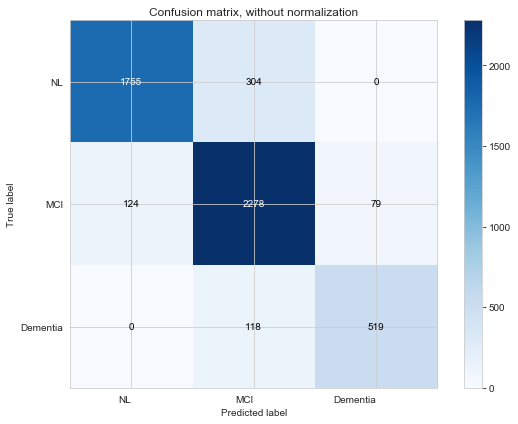

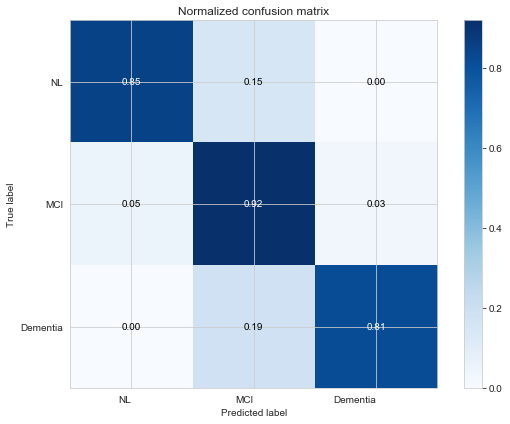

In [67]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
sns.set_style("whitegrid")
sns.despine()


def plot_confusion_matrix(y_true, y_pred,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = unique_labels(df3['DX'])
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots(figsize = (8,6))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=['NL','MCI','Dementia'], yticklabels=['NL','MCI','Dementia'],
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=0, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(test_y, preds_y,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(test_y, preds_y, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

<Figure size 432x288 with 0 Axes>

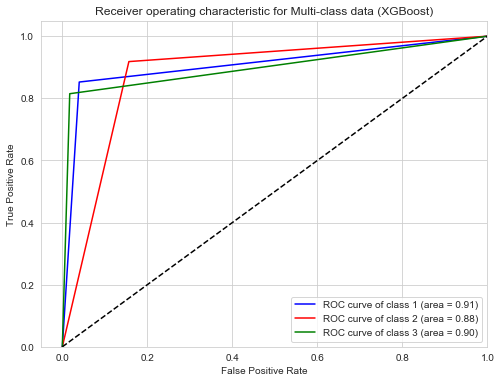

In [68]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

sns.set_style("whitegrid")
sns.despine()
fig,ax = plt.subplots(figsize = (8,6))

# Binarize the output
y_bin = label_binarize(test_y, classes=[ 1, 2,3])
n_classes = y_bin.shape[1]

y_score = label_binarize(preds_y, classes=[1, 2,3])


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['blue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i + 1, roc_auc[i] ))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for Multi-class data (XGBoost)')
plt.legend(loc="lower right")
plt.show()

### Code:
    https://www.kaggle.com/akshita72/alzheimers-prediction

In [69]:
#!pip install shap

### https://github.com/slundberg/shap

In [70]:
import shap
import xgboost

# load JS visualization code to notebook
shap.initjs()

model = xgboost.train({"learning_rate": 0.01, "n_estimators": 100, "eval_set":[(test_X, test_y)] }, xgboost.DMatrix(train_X, train_y), 100)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_X)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], train_X.iloc[0,:])

In [71]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, train_X)

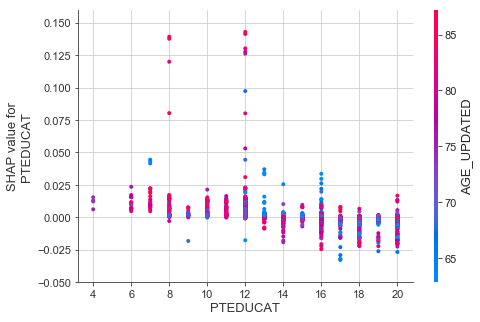

In [72]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("PTEDUCAT", shap_values, train_X)

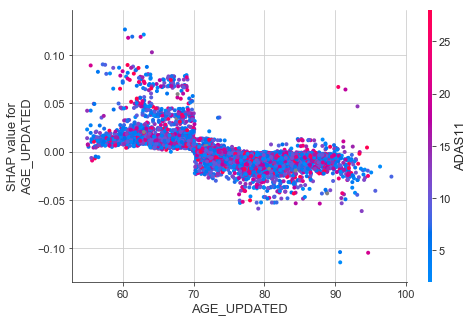

In [73]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("AGE_UPDATED", shap_values, train_X)

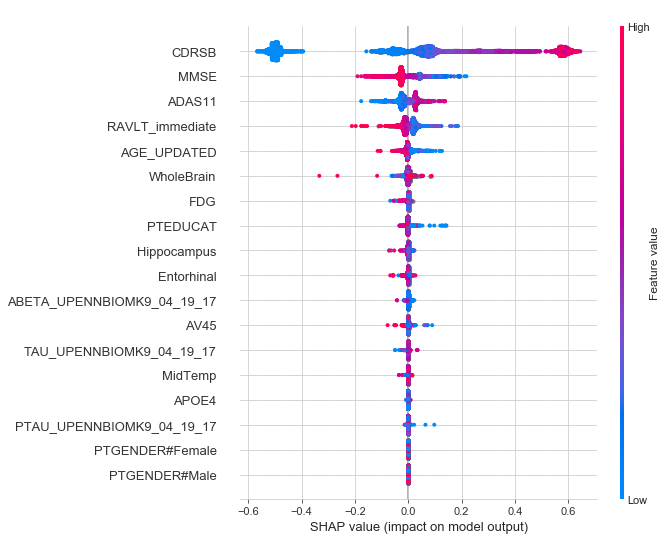

In [74]:
# summarize the effects of all the features
shap.summary_plot(shap_values, train_X)

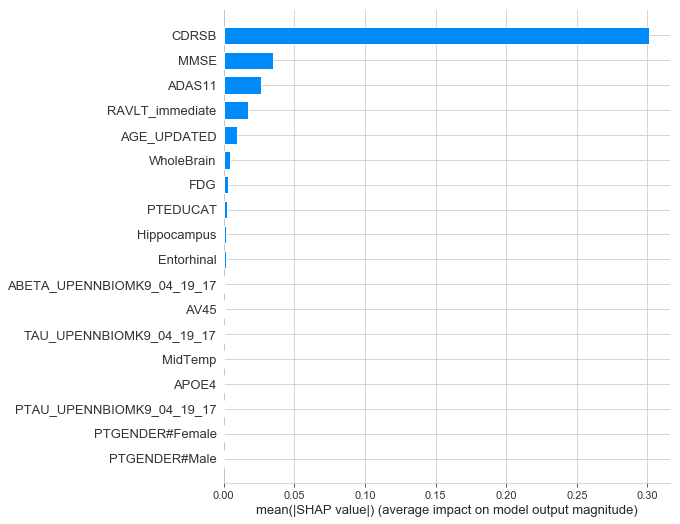

In [75]:
shap.summary_plot(shap_values, train_X, plot_type="bar")

#### Reduce Features

In [76]:
train_X = df3[predictors][df3['D1'] == 1]
train_X = train_X[['CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'WholeBrain',  'AGE_UPDATED']]
test_X = df3[predictors][df3['D2'] == 1]
test_X = test_X[['CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'WholeBrain',  'AGE_UPDATED']]


train_y = df3.DX[df3['D1'] == 1]
test_y = df3.DX[df3['D2'] == 1]

In [77]:
#Impute missing values after train test split
my_imputer = SimpleImputer()
train_X_imputed = pd.DataFrame(my_imputer.fit_transform(train_X.values))
test_X_imputed = pd.DataFrame(my_imputer.fit_transform(test_X.values))

In [78]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_X_scaled = scaler.fit_transform(train_X_imputed)
test_X_scaled = scaler.fit_transform(test_X_imputed)

In [79]:
# XGBoost with parameters tuning 
xgb_model = XGBClassifier(n_estimators=1000)
xgb_model.fit(train_X_scaled, train_y) 
preds_y = xgb_model.predict(test_X_scaled)
print("XGBoost Results with Parameter Tuning")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results with Parameter Tuning
{1: 0.5917420539249297, 2: 0.5982388257582553, 3: 0.9330600488246806}


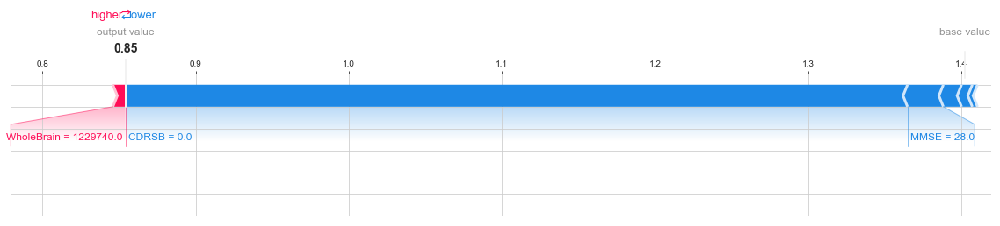

In [80]:
import shap
import xgboost

# load JS visualization code to notebook
shap.initjs()

model = xgboost.train({"learning_rate": 0.01, "n_estimators": 100, "eval_set":[(test_X, test_y)] }, xgboost.DMatrix(train_X, train_y), 100)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_X)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], train_X.iloc[0,:],matplotlib=True)

In [81]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, train_X)

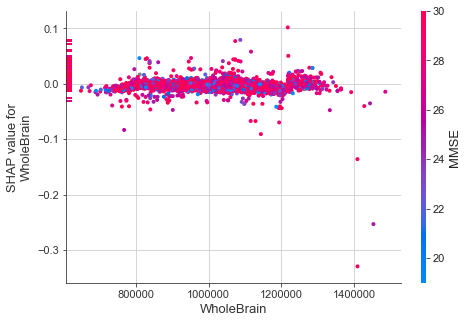

In [82]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("WholeBrain", shap_values, train_X)

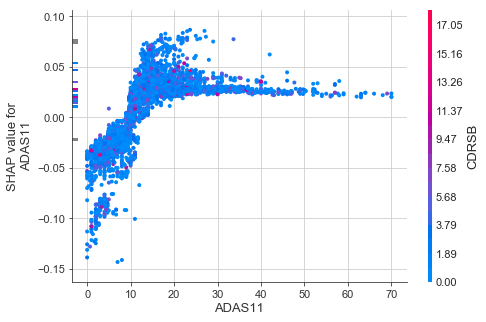

In [83]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("ADAS11", shap_values, train_X)

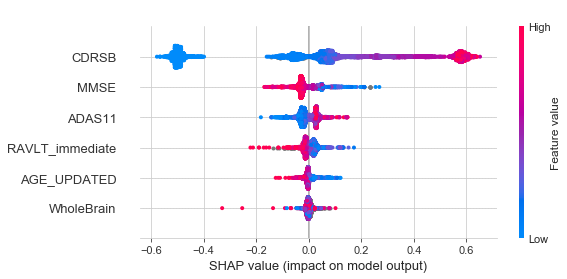

In [84]:
# summarize the effects of all the features
shap.summary_plot(shap_values, train_X)

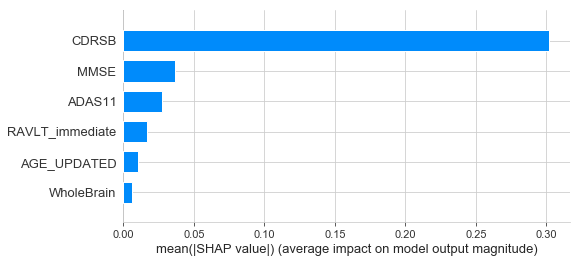

In [85]:
shap.summary_plot(shap_values, train_X, plot_type="bar")